## FINAL VIDEO PRESENTATION


### setup


In [1]:
import os
import cv2
import torch
from torchvision import transforms
from PIL import Image
import numpy as np
import time

import torch.nn as nn


### 1. extract frame from video

In [2]:
#Extract frames from video
def extract_frames(video_path, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    cap = cv2.VideoCapture(video_path)
    i = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        filename = os.path.join(output_dir, f"frame_{i:04d}.png")
        cv2.imwrite(filename, frame)
        i += 1
    cap.release()
    print(f"Extracted {i} frames.")



In [3]:
video_path = "123.MOV"  # Replace with your video file
frames_dir = "frames"
extract_frames(video_path, frames_dir)

Extracted 551 frames.


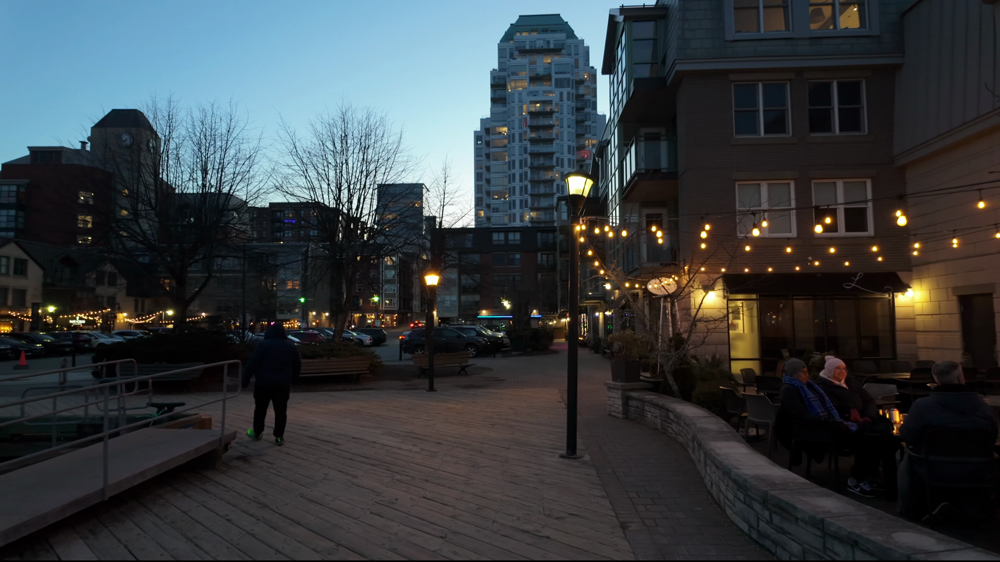

In [4]:
display(Image.open("frames/frame_0300.png"))

In [51]:
# # AnimeGANv2 Generator (simplified)
# class ResidualBlock(nn.Module):
#     def __init__(self, channels):
#         super(ResidualBlock, self).__init__()
#         self.block = nn.Sequential(
#             nn.Conv2d(channels, channels, kernel_size=3, padding=1),
#             nn.InstanceNorm2d(channels, affine=True),
#             nn.ReLU(inplace=True),
#             nn.Conv2d(channels, channels, kernel_size=3, padding=1),
#             nn.InstanceNorm2d(channels, affine=True)
#         )

#     def forward(self, x):
#         return x + self.block(x)


In [52]:
# # AnimeGANv2 Generator (simplified)
# class Generator(nn.Module):
#     def __init__(self):
#         super(Generator, self).__init__()
#         self.model = nn.Sequential(
#             nn.Conv2d(3, 32, kernel_size=7, stride=1, padding=3),
#             nn.ReLU(inplace=True),
#             nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
#             nn.ReLU(inplace=True),
#             nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
#             nn.ReLU(inplace=True),
#             *[ResidualBlock(128) for _ in range(5)],
#             nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
#             nn.ReLU(inplace=True),
#             nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
#             nn.ReLU(inplace=True),
#             nn.Conv2d(32, 3, kernel_size=7, stride=1, padding=3),
#             nn.Tanh()
#         )

#     def forward(self, x):
#         return self.model(x)


### 2.Colorization

In [5]:
# Image Colorization using a simpler approach
def apply_image_colorization(input_image_path, output_image_path):
    # Load the input image
    bw_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    # use color map from opencv
    colorized = cv2.applyColorMap(bw_image, cv2.COLORMAP_RAINBOW)
    

    alpha = 1  # Blend factor
    original_color = cv2.cvtColor(bw_image, cv2.COLOR_GRAY2BGR)
    blended = cv2.addWeighted(colorized, alpha, original_color, 1-alpha, 0)
    
    # Save the output image
    cv2.imwrite(output_image_path, blended)


def apply_image_colorization_to_frames(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in sorted(os.listdir(input_folder)):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)

            apply_image_colorization(input_path, output_path)
            print(f"Processed: {filename}")
    

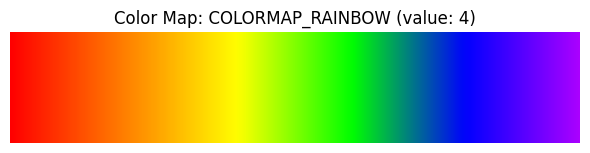

In [6]:
# Create a sample grayscale image to visualize the color map
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Create a gradient from 0 to 255
gradient = np.linspace(0, 255, 256).astype(np.uint8)
# Repeat the gradient to create a 2D image
gradient_2d = np.tile(gradient, (50, 1))

# Apply the color map
colorized = cv2.applyColorMap(gradient_2d, cv2.COLORMAP_RAINBOW)
# Convert from BGR to RGB for display
colorized_rgb = cv2.cvtColor(colorized, cv2.COLOR_BGR2RGB)

# Display the color map
plt.figure(figsize=(6, 3))
plt.imshow(colorized_rgb)
plt.title(f"Color Map: COLORMAP_RAINBOW (value: {cv2.COLORMAP_RAINBOW})")
plt.axis('off')
plt.tight_layout()
plt.show()

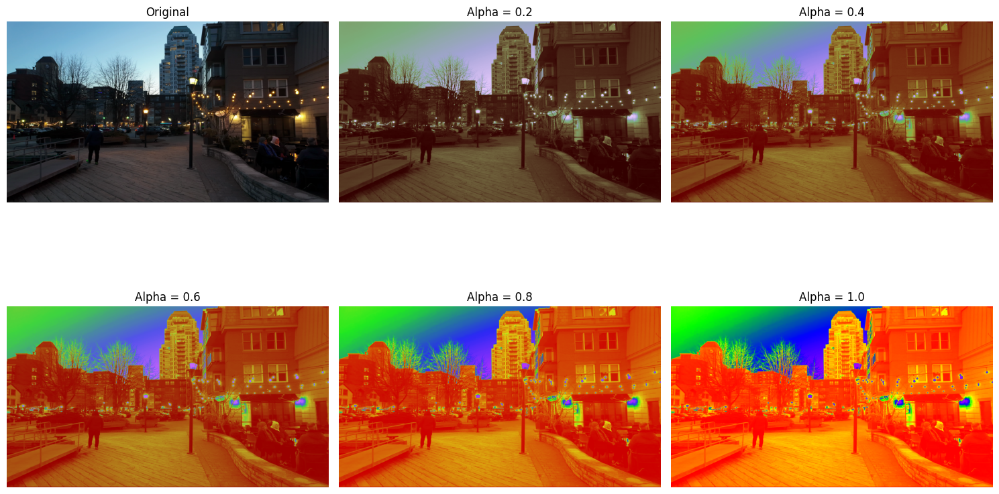

In [7]:
# apply_image_colorization_to_frames(frames_dir, "colorized_1")
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(Image.open("frames/frame_0300.png"))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(Image.open("colorized_0.2/frame_0300.png"))
plt.title("Alpha = 0.2")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(Image.open("colorized_0.4/frame_0300.png"))
plt.title("Alpha = 0.4")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(Image.open("colorized_0.6/frame_0300.png"))
plt.title("Alpha = 0.6")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(Image.open("colorized_0.8/frame_0300.png"))
plt.title("Alpha = 0.8")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(Image.open("colorized_1/frame_0300.png"))
plt.title("Alpha = 1.0")
plt.axis('off')

plt.tight_layout()
plt.show()

### 3. Tilt Shifts and Blurring/Deblurring

In [8]:
#tilt shift
def tilt_shift_effect(image, blur_strength=10):
    height, width = image.shape[:2]

    # Create a blurred version of the image
    blurred = cv2.GaussianBlur(image, (0, 0), sigmaX=blur_strength, sigmaY=blur_strength)

    # Create a mask to divide the image into three rows
    mask = np.zeros((height, 1), dtype=np.float32)

    # Define the height of each row
    row_height = height // 3
    transition_height = row_height // 2

    for y in range(height):
        if y < row_height - transition_height:  # Top row (blurred)
            mask[y] = 1.0
        elif y < row_height + transition_height:  # Transition from blurred to clear
            mask[y] = (row_height + transition_height - y) / (2 * transition_height)
        elif y < 2 * row_height - transition_height:  # Middle row (clear)
            mask[y] = 0.0
        elif y < 2 * row_height + transition_height:  # Transition from clear to blurred
            mask[y] = (y - (2 * row_height - transition_height)) / (2 * transition_height)
        else:  # Bottom row (blurred)
            mask[y] = 1.0

    mask = np.repeat(mask, width, axis=1)
    mask = cv2.merge([mask, mask, mask])

    # Blend images using the mask
    blended = (image * (1 - mask) + blurred * mask).astype(np.uint8)

    return blended

def process_frames_with_tilt_shift(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in sorted(os.listdir(input_folder)):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)

            image = cv2.imread(input_path)
            if image is not None:
                processed = tilt_shift_effect(image)
                cv2.imwrite(output_path, processed)
                print(f"Processed: {filename}")


In [9]:
tilt_dir = "tilt"
process_frames_with_tilt_shift(frames_dir, tilt_dir)


Processed: frame_0000.png
Processed: frame_0001.png
Processed: frame_0002.png
Processed: frame_0003.png
Processed: frame_0004.png
Processed: frame_0005.png
Processed: frame_0006.png
Processed: frame_0007.png
Processed: frame_0008.png
Processed: frame_0009.png
Processed: frame_0010.png
Processed: frame_0011.png
Processed: frame_0012.png
Processed: frame_0013.png
Processed: frame_0014.png
Processed: frame_0015.png
Processed: frame_0016.png
Processed: frame_0017.png
Processed: frame_0018.png
Processed: frame_0019.png
Processed: frame_0020.png
Processed: frame_0021.png
Processed: frame_0022.png
Processed: frame_0023.png
Processed: frame_0024.png
Processed: frame_0025.png
Processed: frame_0026.png
Processed: frame_0027.png
Processed: frame_0028.png
Processed: frame_0029.png
Processed: frame_0030.png
Processed: frame_0031.png
Processed: frame_0032.png
Processed: frame_0033.png
Processed: frame_0034.png
Processed: frame_0035.png
Processed: frame_0036.png
Processed: frame_0037.png
Processed: f

`Normal Blur by Defocus Blur`

In [12]:
import cv2
import numpy as np

#normal blur
def apply_defocus_blur(image_path, kernel_size=15):
    img = cv2.imread(image_path)
    blurred = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    return blurred


def process_frames_with_normal_blur(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in sorted(os.listdir(input_folder)):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)


            processed = apply_defocus_blur(input_path)

            cv2.imwrite(output_path, processed)
            print(f"Processed: {filename}")




In [13]:
process_frames_with_normal_blur("frames", "normal_blur")

Processed: frame_0000.png
Processed: frame_0001.png
Processed: frame_0002.png
Processed: frame_0003.png
Processed: frame_0004.png
Processed: frame_0005.png
Processed: frame_0006.png
Processed: frame_0007.png
Processed: frame_0008.png
Processed: frame_0009.png
Processed: frame_0010.png
Processed: frame_0011.png
Processed: frame_0012.png
Processed: frame_0013.png
Processed: frame_0014.png
Processed: frame_0015.png
Processed: frame_0016.png
Processed: frame_0017.png
Processed: frame_0018.png
Processed: frame_0019.png
Processed: frame_0020.png
Processed: frame_0021.png
Processed: frame_0022.png
Processed: frame_0023.png
Processed: frame_0024.png
Processed: frame_0025.png
Processed: frame_0026.png
Processed: frame_0027.png
Processed: frame_0028.png
Processed: frame_0029.png
Processed: frame_0030.png
Processed: frame_0031.png
Processed: frame_0032.png
Processed: frame_0033.png
Processed: frame_0034.png
Processed: frame_0035.png
Processed: frame_0036.png
Processed: frame_0037.png
Processed: f

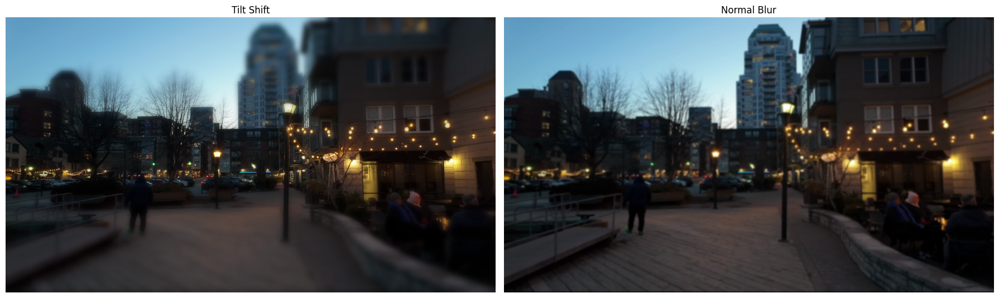

In [14]:
import matplotlib.pyplot as plt

# Load the images
original = Image.open("frames/frame_0300.png")
tilt_shift = Image.open("tilt/frame_0300.png")
normal_blur = Image.open("normal_blur/frame_0300.png")

# Create a figure with 3 subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# # Display images in the subplots
# axes[0].imshow(original)
# axes[0].set_title('Original')
# axes[0].axis('off')

axes[0].imshow(tilt_shift)
axes[0].set_title('Tilt Shift')
axes[0].axis('off')

axes[1].imshow(normal_blur)
axes[1].set_title('Normal Blur')
axes[1].axis('off')

plt.tight_layout()
plt.show()

`Fergus Deblur`

In [20]:
import cv2
import numpy as np

def simple_fergus_deblur(image_path):
    """
    A simple Fergus algorithm to deblur an image using an advanced kernel for better performance.
    """
    # Load image in color (OpenCV loads BGR)
    img_bgr = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Gaussian kernel
    kernel = np.array([[1,  4,  6,  4,  1],
                       [4, 16, 24, 16,  4],
                       [6, 24, 36, 24,  6],
                       [4, 16, 24, 16,  4],
                       [1,  4,  6,  4,  1]], np.float32) / 256

    # Apply the kernel to the image using filter2D
    deblurred = cv2.filter2D(img_rgb, -1, kernel)

    # Optionally, apply a sharpening filter to enhance the deblurred image
    sharpen_kernel = np.array([[0, -1, 0],
                                [-1, 5, -1],
                                [0, -1, 0]], np.float32)
    deblurred = cv2.filter2D(deblurred, -1, sharpen_kernel)

    return deblurred

def process_frames_with_simple_fergus_deblur(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in sorted(os.listdir(input_folder)):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            deblurred = simple_fergus_deblur(input_path)
            
            # Convert RGB back to BGR before saving
            deblurred_bgr = cv2.cvtColor(deblurred, cv2.COLOR_RGB2BGR)
            cv2.imwrite(os.path.join(output_folder, filename), deblurred_bgr)
            print(f"Processed: {filename}")


`Deblur by Sharpening and Denoising`

In [21]:
def process_frames_with_Sharpen_denoise(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in sorted(os.listdir(input_folder)):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            image = cv2.imread(input_path)

            # Sharpening kernel for enhanced sharpness
            sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
            sharpened = cv2.filter2D(image, -1, sharpen_kernel)

            # Denoising after sharpening
            deblurred = cv2.fastNlMeansDenoisingColored(sharpened, None, 10, 10, 7, 21)
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, deblurred)
            print(f"Processed: {filename}")

In [22]:
# process_frames_with_Sharpen_denoise("normal_blur", "Sharpen_denoise")
process_frames_with_simple_fergus_deblur("normal_blur", "fergus_deblur")

Processed: frame_0000.png
Processed: frame_0001.png
Processed: frame_0002.png
Processed: frame_0003.png
Processed: frame_0004.png
Processed: frame_0005.png
Processed: frame_0006.png
Processed: frame_0007.png
Processed: frame_0008.png
Processed: frame_0009.png
Processed: frame_0010.png
Processed: frame_0011.png
Processed: frame_0012.png
Processed: frame_0013.png
Processed: frame_0014.png
Processed: frame_0015.png
Processed: frame_0016.png
Processed: frame_0017.png
Processed: frame_0018.png
Processed: frame_0019.png
Processed: frame_0020.png
Processed: frame_0021.png
Processed: frame_0022.png
Processed: frame_0023.png
Processed: frame_0024.png
Processed: frame_0025.png
Processed: frame_0026.png
Processed: frame_0027.png
Processed: frame_0028.png
Processed: frame_0029.png
Processed: frame_0030.png
Processed: frame_0031.png
Processed: frame_0032.png
Processed: frame_0033.png
Processed: frame_0034.png
Processed: frame_0035.png
Processed: frame_0036.png
Processed: frame_0037.png
Processed: f

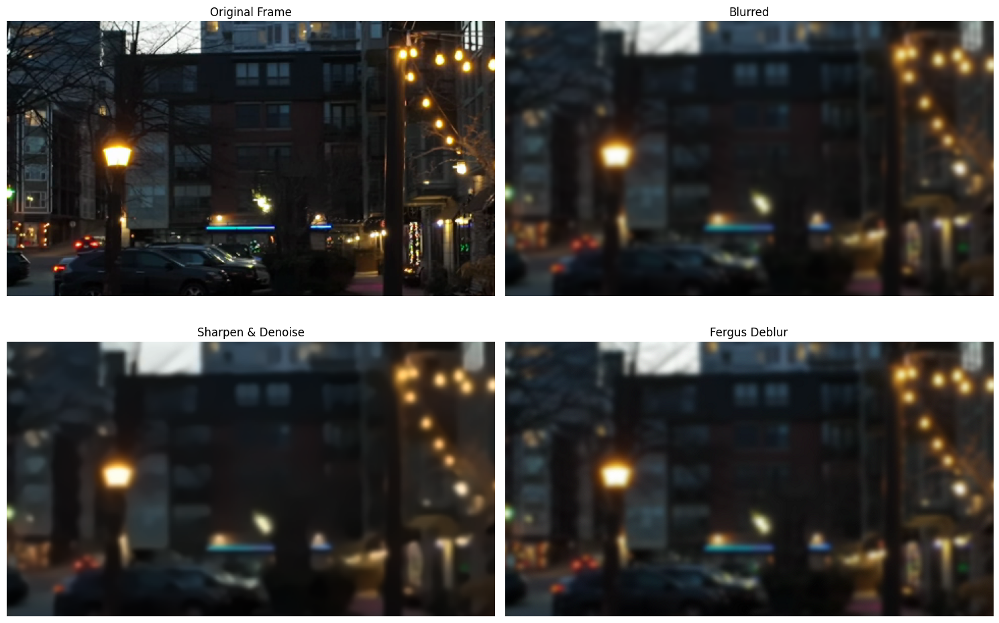

In [24]:
import matplotlib.pyplot as plt

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Load and display images with labels, zooming in on a specific point
image_paths = [
    ("frames/frame_0300.png", "Original Frame"),
    ("normal_blur/frame_0300.png", "Blurred"),
    ("Sharpen_denoise/frame_0300.png", "Sharpen & Denoise"),
    ("fergus_deblur/frame_0300.png", "Fergus Deblur"),
]

for ax, (path, label) in zip(axs.flatten(), image_paths):
    img = Image.open(path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')  # Hide axes

    # Zoom in on a specific point (e.g., center of the image)
    x_center, y_center = img.size[0] // 2, img.size[1] // 2
    zoom_factor = 4  # Increased zoom factor for more zoom
    x1, x2 = x_center - img.size[0] // (2 * zoom_factor), x_center + img.size[0] // (2 * zoom_factor)
    y1, y2 = y_center - img.size[1] // (2 * zoom_factor), y_center + img.size[1] // (2 * zoom_factor)
    ax.set_xlim(x1, x2)
    ax.set_ylim(y2, y1)  # Invert y-axis for correct display


plt.tight_layout()
plt.show()



### 4. Styled colorization

In [25]:
#reference: https://github.com/bryandlee/animegan2-pytorch
def cartoonize_frames(input_dir, output_dir, model=None, batch_size=4):
    os.makedirs(output_dir, exist_ok=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    start_time = time.time()
    
    # Use provided model or load model
    if model is None:
        print("Loading model from torch.hub...")
        model = torch.hub.load("bryandlee/animegan2-pytorch:main", "generator", pretrained="face_paint_512_v1")
    
    model = model.to(device)
    model.eval()
    
    if device.type == 'cuda':
        model = model.half()
        print("Using half precision for faster processing")
    
    # Standard normalization for AnimeGANv2
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    
    # Get all image files
    files = sorted([f for f in os.listdir(input_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    total_files = len(files)
    print(f"Processing {total_files} images in batches of {batch_size}...")
    
    # Process in batches
    with torch.no_grad():  # Disable gradient calculations
        for i in range(0, total_files, batch_size):
            batch_start = time.time()
            batch_files = files[i:i+batch_size]
            
            # Print progress with time estimates
            elapsed = time.time() - start_time
            processed = i + len(batch_files)
            if i > 0:  # Only show estimates after first batch
                time_per_batch = elapsed / (i/batch_size + 1)
                remaining_batches = (total_files - i) / batch_size
                eta = remaining_batches * time_per_batch
                eta_str = f" | ETA: {eta:.1f}s"
            else:
                eta_str = ""
            
            if i % 20 == 0:
                print(f"Processing images {i+1}-{min(i+batch_size, total_files)}/{total_files}{eta_str}")
            
            # Prepare batch
            batch_tensors = []
            original_sizes = []
            
            for img_file in batch_files:
                img_path = os.path.join(input_dir, img_file)
                img = Image.open(img_path).convert("RGB")
                original_sizes.append(img.size)
                
                # Convert to tensor
                input_tensor = transform(img)
                if device.type == 'cuda':
                    input_tensor = input_tensor.half()
                batch_tensors.append(input_tensor)
            
            # Stack tensors into a batch
            input_batch = torch.stack(batch_tensors).to(device)
            
            # Process batch
            output_batch = model(input_batch)
            
            # Process each result in batch
            for j, output_tensor in enumerate(output_batch):
                # Denormalize
                output_tensor = output_tensor * 0.5 + 0.5
                
                # Convert to PIL and resize back to original
                cartoon = transforms.ToPILImage()(output_tensor.cpu().float().clamp(0, 1))
                cartoon = cartoon.resize(original_sizes[j], Image.LANCZOS)
                
                # Save output
                output_path = os.path.join(output_dir, batch_files[j])
                cartoon.save(output_path)
    
    total_time = time.time() - start_time
    print(f"Finished processing {total_files} images in {total_time:.1f} seconds")


In [26]:
styled_dir = "styled"
# cartoonize_frames(tilt_dir, styled_dir)
cartoonize_frames(frames_dir, styled_dir)


Loading model from torch.hub...
Processing 551 images in batches of 4...
Processing images 1-4/551


Using cache found in /Users/bohan/.cache/torch/hub/bryandlee_animegan2-pytorch_main


Processing images 21-24/551 | ETA: 826.1s
Processing images 41-44/551 | ETA: 799.1s
Processing images 61-64/551 | ETA: 770.3s
Processing images 81-84/551 | ETA: 757.1s
Processing images 101-104/551 | ETA: 809.9s
Processing images 121-124/551 | ETA: 853.1s
Processing images 141-144/551 | ETA: 819.2s
Processing images 161-164/551 | ETA: 772.1s
Processing images 181-184/551 | ETA: 732.2s
Processing images 201-204/551 | ETA: 687.8s
Processing images 221-224/551 | ETA: 652.2s
Processing images 241-244/551 | ETA: 606.4s
Processing images 261-264/551 | ETA: 563.5s
Processing images 281-284/551 | ETA: 523.7s
Processing images 301-304/551 | ETA: 487.6s
Processing images 321-324/551 | ETA: 450.1s
Processing images 341-344/551 | ETA: 408.6s
Processing images 361-364/551 | ETA: 369.4s
Processing images 381-384/551 | ETA: 332.2s
Processing images 401-404/551 | ETA: 292.7s
Processing images 421-424/551 | ETA: 253.6s
Processing images 441-444/551 | ETA: 214.8s
Processing images 461-464/551 | ETA: 176

In [28]:
#generated by chatgpt
import cv2
import numpy as np
from skimage.exposure import match_histograms
import os

def blend_with_vangogh(content_path, style_path, output_path, blend_strength=0.9, texture_strength=0.4):
    # Load images
    content = cv2.imread(content_path)
    content = cv2.cvtColor(content, cv2.COLOR_BGR2RGB)
    style = cv2.imread(style_path)
    style = cv2.cvtColor(style, cv2.COLOR_BGR2RGB)

    # Resize style image to match content
    style = cv2.resize(style, (content.shape[1], content.shape[0]))

    # Match color histograms
    matched = match_histograms(content, style, channel_axis=-1)
    # Blend color with original image
    blended_color = cv2.addWeighted(content.astype(np.float32), 1 - blend_strength,
                                    matched.astype(np.float32), blend_strength, 0)

    # Extract texture from style using edge detection
    gray_style = cv2.cvtColor(style, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray_style, 80, 180).astype(np.float32) / 255.0
    edges = cv2.GaussianBlur(edges, (3, 3), 0)
    texture = np.stack([edges] * 3, axis=2)

    # Overlay texture on the blended image
    textured_output = np.clip(blended_color / 255.0 + texture * texture_strength, 0, 1)

    # Convert and save
    output = (textured_output * 255).astype(np.uint8)
    output_bgr = cv2.cvtColor(output, cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_path, output_bgr)

# Example usage:
# blend_with_vangogh("my_photo.jpg", "vangogh_art.jpg", "output.jpg", blend_strength=0.6, texture_strength=0.2)

# Example usage:

def apply_style_transfer_to_frames(input_folder, output_folder, style='starry_night'):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in sorted(os.listdir(input_folder)):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)

            blend_with_vangogh(input_path,"/Users/bohan/Downloads/computational_photography_project_ckpt/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg", output_path)
            print(f"Processed: {filename}")


In [29]:
apply_style_transfer_to_frames(frames_dir, "styled_van_gogh")

Processed: frame_0000.png
Processed: frame_0001.png
Processed: frame_0002.png
Processed: frame_0003.png
Processed: frame_0004.png
Processed: frame_0005.png
Processed: frame_0006.png
Processed: frame_0007.png
Processed: frame_0008.png
Processed: frame_0009.png
Processed: frame_0010.png
Processed: frame_0011.png
Processed: frame_0012.png
Processed: frame_0013.png
Processed: frame_0014.png
Processed: frame_0015.png
Processed: frame_0016.png
Processed: frame_0017.png
Processed: frame_0018.png
Processed: frame_0019.png
Processed: frame_0020.png
Processed: frame_0021.png
Processed: frame_0022.png
Processed: frame_0023.png
Processed: frame_0024.png
Processed: frame_0025.png
Processed: frame_0026.png
Processed: frame_0027.png
Processed: frame_0028.png
Processed: frame_0029.png
Processed: frame_0030.png
Processed: frame_0031.png
Processed: frame_0032.png
Processed: frame_0033.png
Processed: frame_0034.png
Processed: frame_0035.png
Processed: frame_0036.png
Processed: frame_0037.png
Processed: f

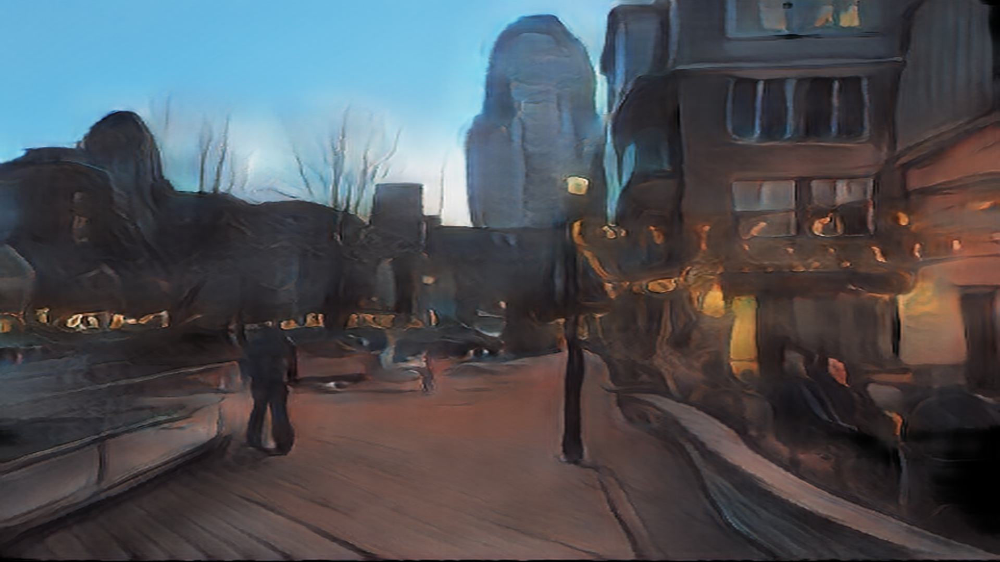

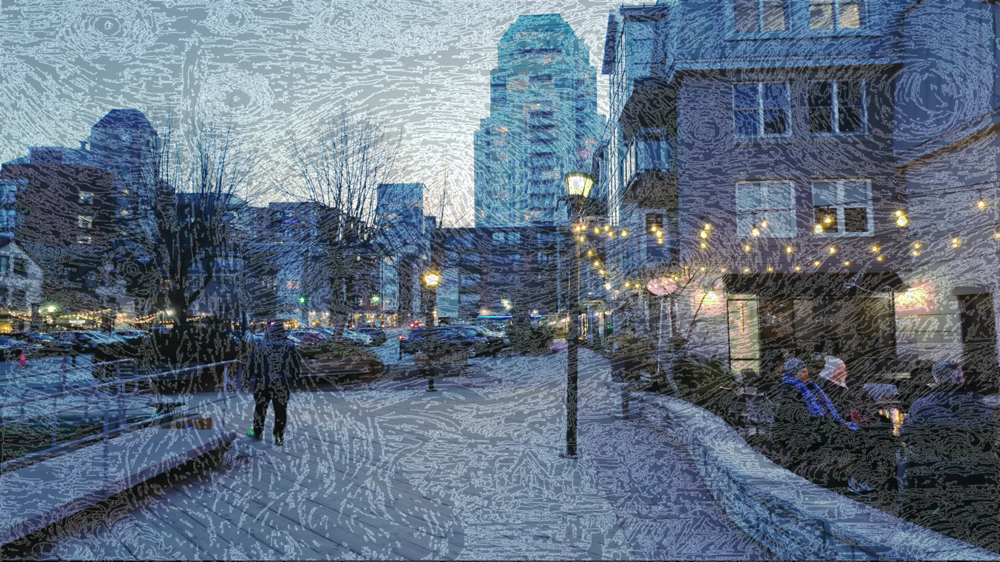

In [31]:
display(Image.open("styled/frame_0300.png"))
display(Image.open("styled_van_gogh/frame_0300.png"))

### 5. Combine to video

In [32]:
#combine frames into video
def frames_to_hd_video(input_folder, output_video_path, fps=30, width=1920, height=1080):
    # Get all image files, sorted
    frames = sorted([f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

    if not frames:
        print("No image files found in folder.")
        return

    # Define video writer with HD resolution
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for filename in frames:
        frame_path = os.path.join(input_folder, filename)
        frame = cv2.imread(frame_path)

        if frame is not None:
            # Resize frame to HD
            frame_resized = cv2.resize(frame, (width, height))
            out.write(frame_resized)
        else:
            print(f"Skipped: {filename} (couldn't read)")

    out.release()
    print(f"HD video saved to: {output_video_path}")



In [35]:
frames_to_hd_video("colorized_0.2", "colorized_0_2.mp4", fps=30)
frames_to_hd_video("colorized_0.4", "colorized_0_4.mp4", fps=30)
frames_to_hd_video("colorized_0.6", "colorized_0_6.mp4", fps=30)
frames_to_hd_video("colorized_0.8", "colorized_0_8.mp4", fps=30)
frames_to_hd_video("colorized_1", "colorized_1.mp4", fps=30)
frames_to_hd_video("normal_blur", "normal_blur.mp4", fps=30)
frames_to_hd_video("Sharpen_denoise", "Sharpen_denoise.mp4", fps=30)
frames_to_hd_video("fergus_deblur", "fergus_deblur.mp4", fps=30)
frames_to_hd_video("tilt", "tilt.mp4", fps=30)
frames_to_hd_video("styled", "styled.mp4", fps=30)
frames_to_hd_video("styled_van_gogh", "styled_van_gogh.mp4", fps=30)

HD video saved to: colorized_0_2.mp4
HD video saved to: colorized_0_4.mp4
HD video saved to: colorized_0_6.mp4
HD video saved to: colorized_0_8.mp4
HD video saved to: colorized_1.mp4
HD video saved to: normal_blur.mp4
HD video saved to: Sharpen_denoise.mp4
HD video saved to: fergus_deblur.mp4
HD video saved to: tilt.mp4
HD video saved to: styled.mp4
HD video saved to: styled_van_gogh.mp4
